# Data Trained- Practice -Mushroom Data Set- Sudha Udayakumar

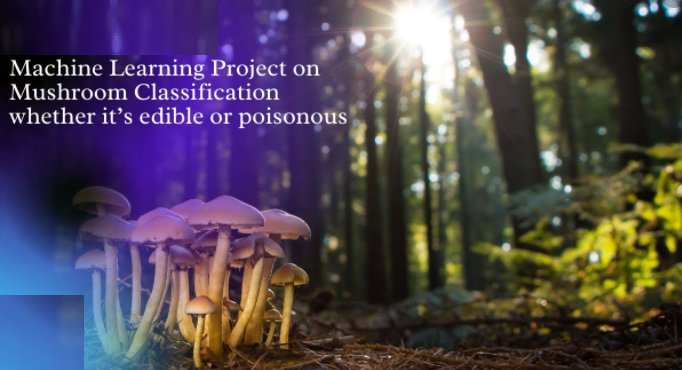

# Stages of Machine Learning

# Introduction (Define Problem)

## Problem Statement Given

## Problem Statement (Summarized)

# Choose Right Tools

## Importing and Installing the Packages

In [1]:
import pandas as pd
pd.set_option('mode.chained_assignment', None)      # To suppress pandas warnings.
pd.set_option('display.max_colwidth', None)       # To display all the data in each column
pd.set_option('display.precision', 3)               # To display values only upto three decimal places.
pd.options.display.max_columns = 50                 # To display every column of the dataset in head()
pd.options.display.float_format = '{:.2f}'.format
import numpy as np
import seaborn as sns
sns.set(style='whitegrid', font_scale = 1.3, color_codes=True)

import matplotlib.pyplot as plt
%matplotlib inline


import warnings

warnings.filterwarnings('ignore')
%matplotlib inline

## Handling Warnings

In [2]:
warnings.filterwarnings('ignore') # ignore warnings.
%config IPCompleter.greedy = True # autocomplete feature.
pd.options.display.max_rows = None # set maximum rows that can be displayed in notebook.
pd.options.display.max_columns = None # set maximum columns that can be displayed in notebook.
pd.options.display.precision = 2 # set the precision of floating point numbers.

# Loading Data

In [3]:
 # Importing training dataset using pd.read_csv from github. Not saving the file locally 
df=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset1/master/mushrooms.csv")

In [4]:
#save the CSV file to a local folder, so that we can use it while uploading to Github
df.to_csv("mushrooms_ML.csv")

In [5]:
# to have a quick glance of data
df.head()

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,p,x,s,n,t,p,f,c,n,k,e,e,s,s,w,w,p,w,o,p,k,s,u
1,e,x,s,y,t,a,f,c,b,k,e,c,s,s,w,w,p,w,o,p,n,n,g
2,e,b,s,w,t,l,f,c,b,n,e,c,s,s,w,w,p,w,o,p,n,n,m
3,p,x,y,w,t,p,f,c,n,n,e,e,s,s,w,w,p,w,o,p,k,s,u
4,e,x,s,g,f,n,f,w,b,k,t,e,s,s,w,w,p,w,o,e,n,a,g


<span style='background:yellow'> Observation: The table is loaded fully and we can see non-numeric data </span>

## Description of Data

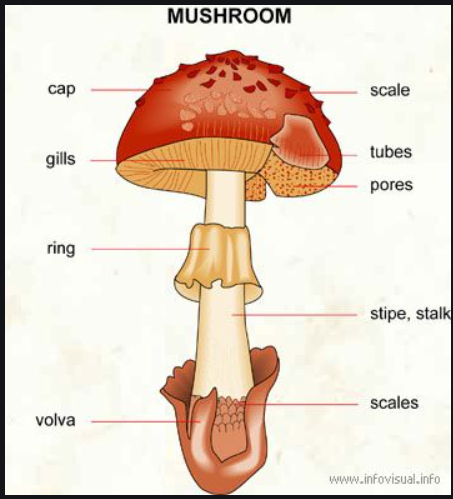
Different features of the musroom in a visual way for easier understanding

<span style='background:yellow'>Observation: We can see that each feature has multiple types in them and all might impact our dataset/span>

# Pre-Profiling of Data

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8124 entries, 0 to 8123
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   class                     8124 non-null   object
 1   cap-shape                 8124 non-null   object
 2   cap-surface               8124 non-null   object
 3   cap-color                 8124 non-null   object
 4   bruises                   8124 non-null   object
 5   odor                      8124 non-null   object
 6   gill-attachment           8124 non-null   object
 7   gill-spacing              8124 non-null   object
 8   gill-size                 8124 non-null   object
 9   gill-color                8124 non-null   object
 10  stalk-shape               8124 non-null   object
 11  stalk-root                8124 non-null   object
 12  stalk-surface-above-ring  8124 non-null   object
 13  stalk-surface-below-ring  8124 non-null   object
 14  stalk-color-above-ring  

<span style='background:yellow'>Observation: All are object columns and there is no missing data</span>

In [7]:
df.shape

(8124, 23)

<span style='background:yellow'>Observation: There are 8124 rows and 23 columns</span>

In [8]:
df.isnull().sum()

class                       0
cap-shape                   0
cap-surface                 0
cap-color                   0
bruises                     0
odor                        0
gill-attachment             0
gill-spacing                0
gill-size                   0
gill-color                  0
stalk-shape                 0
stalk-root                  0
stalk-surface-above-ring    0
stalk-surface-below-ring    0
stalk-color-above-ring      0
stalk-color-below-ring      0
veil-type                   0
veil-color                  0
ring-number                 0
ring-type                   0
spore-print-color           0
population                  0
habitat                     0
dtype: int64

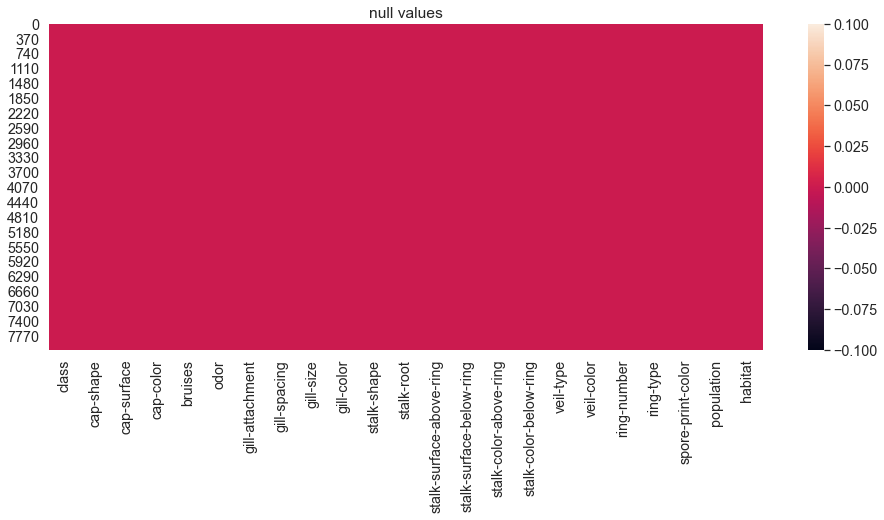

In [9]:
plt.figure(figsize=[16,6])
sns.heatmap(df.isnull())
plt.title("null values")
plt.show()

<span style='background:yellow'>Observation: We already saw there are no missing values. We confirmed it using a heatmap. Increased the figure size to see all the columns
and there are no white dots/lines, so we can confirm with the heatmap there are no missing values</span>

In [10]:
df['class'].value_counts()

e    4208
p    3916
Name: class, dtype: int64

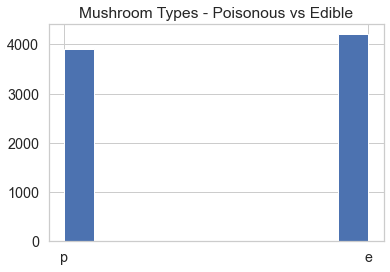

In [11]:
df["class"].hist(grid=True)
plt.title("Mushroom Types - Poisonous vs Edible")
plt.show()



<span style='background:yellow'>Observation: the dataset is a balanced one. As we can see, there are 4208 occurrences of edible mushrooms and 3916 occurrences of poisonous mushrooms in the dataset. </span>

## Label Encoding

The data is categorical so we’ll use LabelEncoder to convert it to ordinal. LabelEncoder converts each value in a column to a number.


In [12]:

from sklearn.preprocessing import LabelEncoder

LE=LabelEncoder()

for column in df.columns:
    df[column] = LE.fit_transform(df[column])

In [13]:
#cross checking the transformed data
df.head()

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,1,5,2,4,1,6,1,0,1,4,0,3,2,2,7,7,0,2,1,4,2,3,5
1,0,5,2,9,1,0,1,0,0,4,0,2,2,2,7,7,0,2,1,4,3,2,1
2,0,0,2,8,1,3,1,0,0,5,0,2,2,2,7,7,0,2,1,4,3,2,3
3,1,5,3,8,1,6,1,0,1,5,0,3,2,2,7,7,0,2,1,4,2,3,5
4,0,5,2,3,0,5,1,1,0,4,1,3,2,2,7,7,0,2,1,0,3,0,1


<span style='background:yellow'>Observation: All the column values are converted to ordinal and there are no non-numerical values   </span>

In [14]:
df.describe()

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
count,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00,8124.00
mean,0.48,3.35,1.83,4.50,0.42,4.14,0.97,0.16,0.31,4.81,0.57,1.11,1.58,1.60,5.82,5.79,0.00,1.97,1.07,2.29,3.60,3.64,1.51
std,0.50,1.60,1.23,2.55,0.49,2.10,0.16,0.37,0.46,3.54,0.50,1.06,0.62,0.68,1.90,1.91,0.00,0.24,0.27,1.80,2.38,1.25,1.72
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,2.00,0.00,3.00,0.00,2.00,1.00,0.00,0.00,2.00,0.00,0.00,1.00,1.00,6.00,6.00,0.00,2.00,1.00,0.00,2.00,3.00,0.00
50%,0.00,3.00,2.00,4.00,0.00,5.00,1.00,0.00,0.00,5.00,1.00,1.00,2.00,2.00,7.00,7.00,0.00,2.00,1.00,2.00,3.00,4.00,1.00
75%,1.00,5.00,3.00,8.00,1.00,5.00,1.00,0.00,1.00,7.00,1.00,1.00,2.00,2.00,7.00,7.00,0.00,2.00,1.00,4.00,7.00,4.00,2.00
max,1.00,5.00,3.00,9.00,1.00,8.00,1.00,1.00,1.00,11.00,1.00,4.00,3.00,3.00,8.00,8.00,0.00,3.00,2.00,4.00,8.00,5.00,6.00


<span style='background:yellow'>Observation:From the above we can see veil-type is not having values, lets check
    and if needed delete the column</span>

### Dropping a column with null values

In [15]:
df['veil-type']

0       0
1       0
2       0
3       0
4       0
5       0
6       0
7       0
8       0
9       0
10      0
11      0
12      0
13      0
14      0
15      0
16      0
17      0
18      0
19      0
20      0
21      0
22      0
23      0
24      0
25      0
26      0
27      0
28      0
29      0
30      0
31      0
32      0
33      0
34      0
35      0
36      0
37      0
38      0
39      0
40      0
41      0
42      0
43      0
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      0
54      0
55      0
56      0
57      0
58      0
59      0
60      0
61      0
62      0
63      0
64      0
65      0
66      0
67      0
68      0
69      0
70      0
71      0
72      0
73      0
74      0
75      0
76      0
77      0
78      0
79      0
80      0
81      0
82      0
83      0
84      0
85      0
86      0
87      0
88      0
89      0
90      0
91      0
92      0
93      0
94      0
95      0
96      0
97      0
98      0
99      0


<span style='background:yellow'>Observation: We can see all values are 0, so lets drop it  </span>

In [16]:
df = df.drop(["veil-type"],axis=1)

In [17]:
df.head()

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,1,5,2,4,1,6,1,0,1,4,0,3,2,2,7,7,2,1,4,2,3,5
1,0,5,2,9,1,0,1,0,0,4,0,2,2,2,7,7,2,1,4,3,2,1
2,0,0,2,8,1,3,1,0,0,5,0,2,2,2,7,7,2,1,4,3,2,3
3,1,5,3,8,1,6,1,0,1,5,0,3,2,2,7,7,2,1,4,2,3,5
4,0,5,2,3,0,5,1,1,0,4,1,3,2,2,7,7,2,1,0,3,0,1


<span style='background:yellow'>Observation: Column viel-type is not there in the dataset </span>

## Check for outliers & Skewness

<span style='background:pink'>
Note:
always check outliers before train & Test split. coz if we remove outliers only in train & Not in test
so better to check outliers before itself
skewness can be checked after train and test..but best rule of thumb is to do before
#skewness and outliers are related , 
1st check for outliers- remove it and skewness might get corrected as well
2nd check for skewness- if you have skewness , you can correct it using log, squareroot, cuberoot boxfox, powertransform
Based on the scenario use it according. 0 or -ve value cannot be used for boxfox 
powertransform works on 0 and -ve values
</span>

<span style='background:yellow'>Observation: However for classification data we cant check for Outliers and skewness. Just 
added the note on Outliers & Skewness to call it out, that it was considered and dropped as it was a classification data</span>

<span style='background:pink'>Notes: Now that our data is all set for analysis, lets move to EDA</span>

# EDA- Exploratory Data Analysis

## UniVariate Analysis

### Univariate Analysis- Target Column

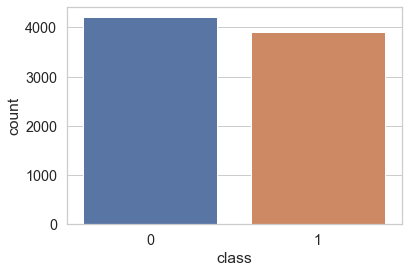

In [18]:
sns.countplot(df["class"])

<span style='background:yellow'> Observation:Our target column "class" is also converted using Label Encoder.  

    
    Before the Label Encoding
    e    4208 (edible)-0
    p    3916 (Poisonous)-1
    
    
    so as per Label Encoding, 0 & 1 is encoded alphabetically. So now edible is 0 and poisonous is 1
    As in the dataset, we can see the bar that 0 is bigger than1 , which confirms that edible is 0 and poisonous is 1 

### Univariate Analysis- Features 

<span style='background:pink'>Note: we have seen the univariate analysis of the target column. The unwanted columns have already been dropped.
    So all the remaining columns are features for the dataset. So lets analyse and see each feature.
    Instead of doing a plot for eachfeature, we will do it in a loop</span>

In [19]:

features=df.drop(columns='class')
#As discussed above, dropping the "class" which is the target column and all other columns are grouped under features

In [20]:
#sns.countplot?
#used it to check few updates

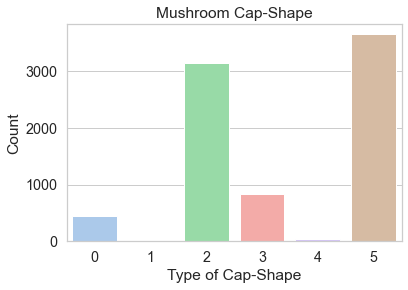

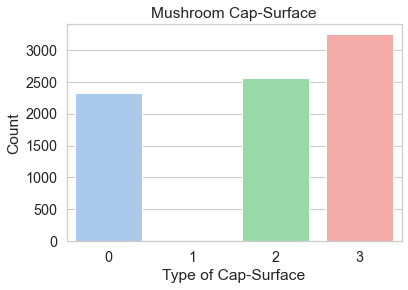

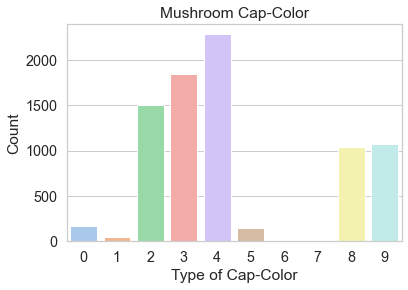

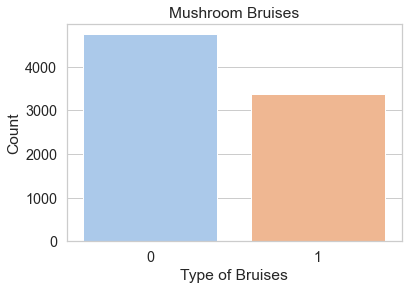

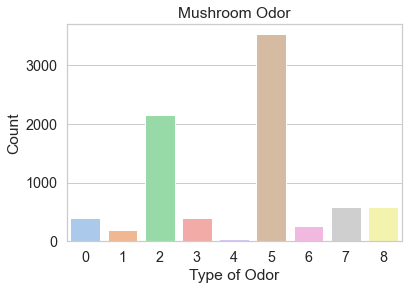

...

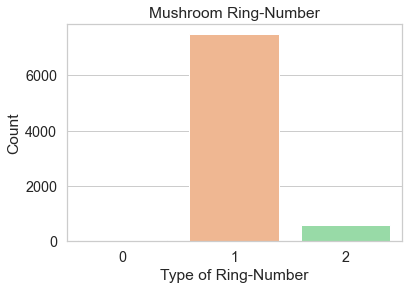

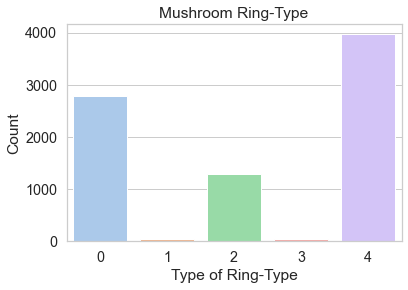

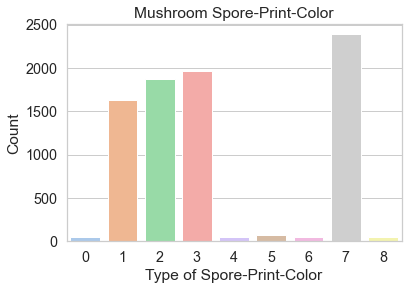

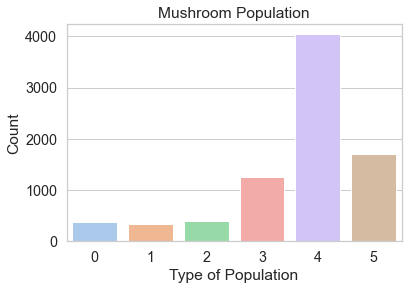

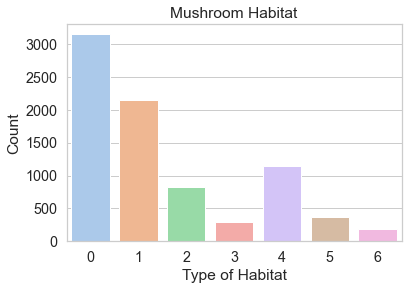

In [21]:

for col in features.columns:
    
    plt.figure()
    sns.countplot(features[col],palette=("pastel"))
    plt.ylabel('Count')
    plt.title('Mushroom' + ' ' + col.title())
    plt.xlabel('Type of' + ' ' + col.title())
    

plt.show()

<span style='background:yellow'>Observation:Every Feature has multiple values and so we would need all of them in our Model building  </span>

## Bi-Variate Analysis (Against Target Variable)

<span style='background:pink'>Note: We saw the target & the features and we summarized that all are needed </span>
    
    
<span style='background:pink'>Note: Now lets analyse each feature column, with our target column and see the impact.
    To make it more easy, we will mark the Edible ones with green and the poisonous ones with red. 
    These colors are choosen generally, coz green means its a go (edible here) and red means danger/stop (poisonous here), so going with this color combo</span>

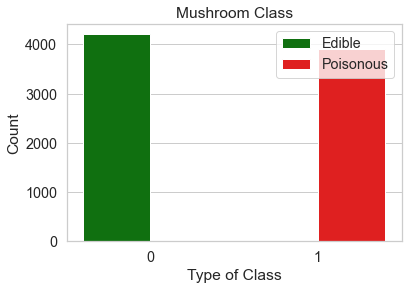

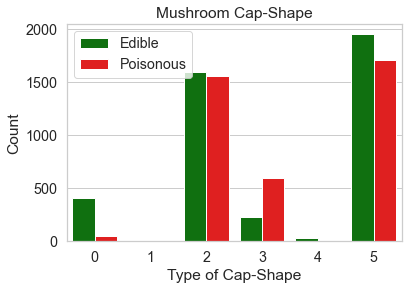

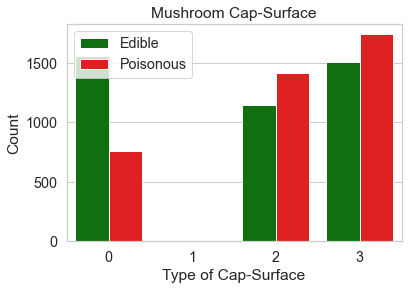

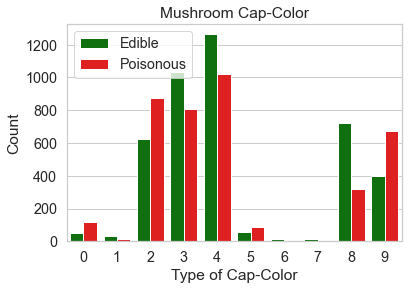

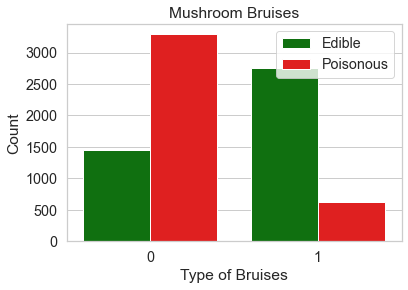

...

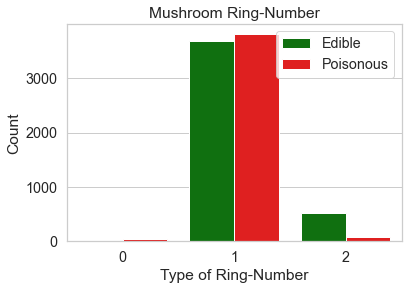

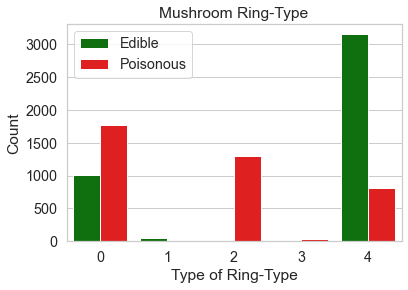

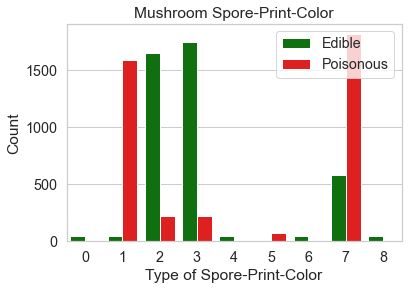

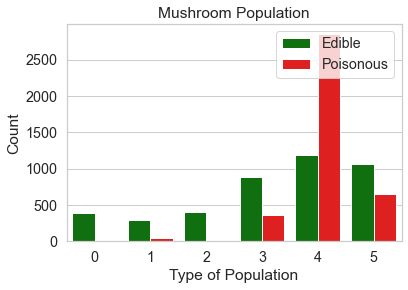

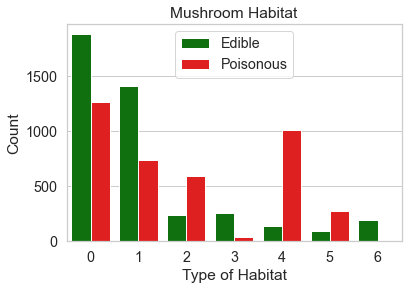

In [22]:

for col in df:
    fig,ax = plt.subplots()
    
    sns.countplot(col,hue=df['class'],palette=['green','red'],data=df)
    plt.ylabel('Count')
    plt.xlabel('Type of' + ' ' + col.title())
    plt.title('Mushroom' + ' ' + col.title())
    plt.legend(title=None,labels=['Edible','Poisonous'])

<span style='background:yellow'>Observation: As we planned the first graph confirms that our Edible is in green and Poisonous is in Red  </span>

<span style='background:yellow'>Observation:And all features have both Edible & Poisonous type mushrooms. This only confirms that we cannot drop any column as each value in the feature will impact our model  </span>

## Multivariate Analysis

## Corelation

In [23]:
corr_mat=df.corr()
corr_mat

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-color,ring-number,ring-type,spore-print-color,population,habitat
class,1.00,0.05,0.18,-0.03,-0.50,-0.09,0.13,-0.35,0.54,-0.53,-0.10,-0.38,-0.33,-0.30,-0.15,-0.15,0.15,-0.21,-0.41,0.17,0.30,0.22
cap-shape,0.05,1.00,-0.05,-0.05,-0.04,-0.02,0.08,0.01,0.05,-0.01,0.06,0.03,-0.03,-0.03,-0.03,-0.03,0.07,-0.11,-0.03,-0.07,0.06,-0.04
cap-surface,0.18,-0.05,1.00,-0.02,0.07,0.05,-0.03,-0.28,0.21,-0.16,-0.01,-0.13,0.09,0.11,0.07,0.07,-0.02,-0.03,-0.11,0.23,0.02,0.16
cap-color,-0.03,-0.05,-0.02,1.00,-0.00,-0.39,0.04,0.14,-0.17,0.08,-0.46,0.32,-0.06,-0.05,0.00,0.01,0.04,-0.01,0.16,-0.29,-0.14,0.03
bruises,-0.50,-0.04,0.07,-0.00,1.00,-0.06,0.14,-0.30,-0.37,0.53,0.10,0.24,0.46,0.46,0.08,0.09,0.12,0.06,0.69,-0.29,0.09,-0.08
odor,-0.09,-0.02,0.05,-0.39,-0.06,1.00,-0.06,0.06,0.31,-0.13,0.46,-0.21,0.12,0.06,0.17,0.17,-0.06,0.11,-0.28,0.47,-0.04,-0.03
gill-attachment,0.13,0.08,-0.03,0.04,0.14,-0.06,1.00,0.07,0.11,-0.13,0.19,0.14,-0.09,-0.12,0.10,0.10,0.90,0.09,-0.15,-0.03,0.17,-0.03
gill-spacing,-0.35,0.01,-0.28,0.14,-0.30,0.06,0.07,1.00,-0.11,0.10,0.08,0.35,-0.21,-0.21,0.27,0.25,0.07,0.24,-0.20,0.05,-0.53,-0.15
gill-size,0.54,0.05,0.21,-0.17,-0.37,0.31,0.11,-0.11,1.00,-0.52,0.21,-0.34,0.06,0.01,0.30,0.28,0.10,-0.17,-0.46,0.62,0.15,0.16
gill-color,-0.53,-0.01,-0.16,0.08,0.53,-0.13,-0.13,0.10,-0.52,1.00,-0.18,0.32,0.22,0.26,-0.06,-0.07,-0.10,0.10,0.63,-0.42,-0.03,-0.20


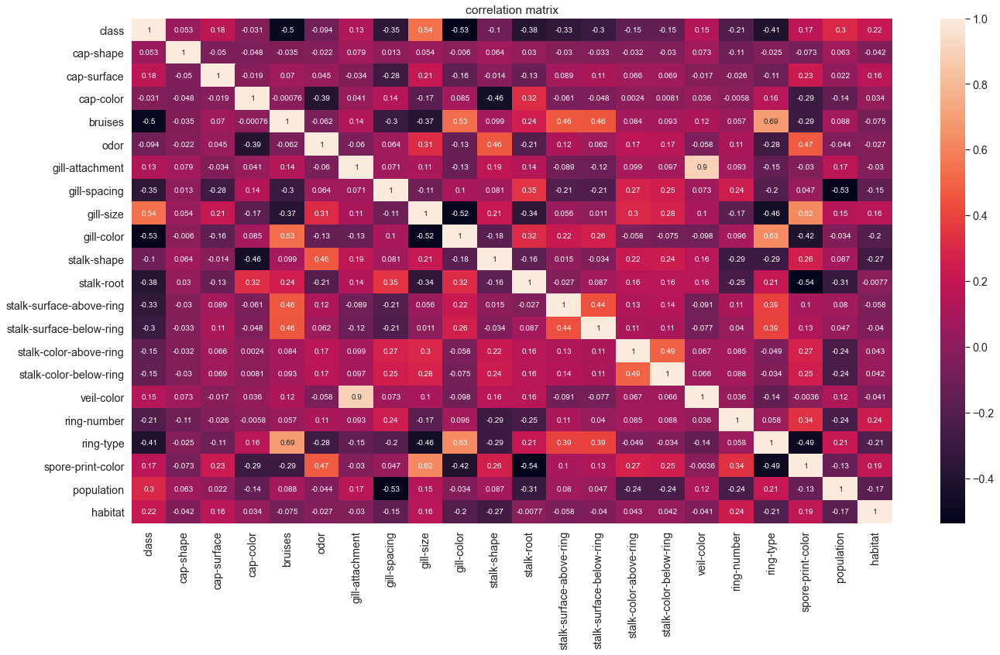

In [24]:
#the above table is very difficult to interpret, so lets draw a heatmap
plt.figure(figsize=[22,12])
sns.heatmap(corr_mat,annot=True)
plt.title("correlation matrix")
plt.show()

In [25]:
#even the heatmap was tough to analyse. So lets do it in a ascending order and correlate with the target variable"class"
corr_matrix = df.corr()
corr_matrix["class"].sort_values(ascending=True)


gill-color                 -0.53
bruises                    -0.50
ring-type                  -0.41
stalk-root                 -0.38
gill-spacing               -0.35
stalk-surface-above-ring   -0.33
stalk-surface-below-ring   -0.30
ring-number                -0.21
stalk-color-above-ring     -0.15
stalk-color-below-ring     -0.15
stalk-shape                -0.10
odor                       -0.09
cap-color                  -0.03
cap-shape                   0.05
gill-attachment             0.13
veil-color                  0.15
spore-print-color           0.17
cap-surface                 0.18
habitat                     0.22
population                  0.30
gill-size                   0.54
class                       1.00
Name: class, dtype: float64

<span style='background:yellow'>Observation:Usually, the least correlating variable is the most important one for classification. In this case, “gill-color” is -0.53 will be more critical and gill-size with 0.54 might not be that critical. However all of them make an impact on the model. </span>

# Model Building

## Splitting into Train & Test Data

In [26]:
x=df.drop("class",axis=1)
y=df["class"]
x

,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,5,2,4,1,6,1,0,1,4,0,3,2,2,7,7,2,1,4,2,3,5
1,5,2,9,1,0,1,0,0,4,0,2,2,2,7,7,2,1,4,3,2,1
2,0,2,8,1,3,1,0,0,5,0,2,2,2,7,7,2,1,4,3,2,3
3,5,3,8,1,6,1,0,1,5,0,3,2,2,7,7,2,1,4,2,3,5
4,5,2,3,0,5,1,1,0,4,1,3,2,2,7,7,2,1,0,3,0,1
5,5,3,9,1,0,1,0,0,5,0,2,2,2,7,7,2,1,4,2,2,1
6,0,2,8,1,0,1,0,0,2,0,2,2,2,7,7,2,1,4,2,2,3
7,0,3,8,1,3,1,0,0,5,0,2,2,2,7,7,2,1,4,3,3,3
8,5,3,8,1,6,1,0,1,7,0,3,2,2,7,7,2,1,4,2,4,1
9,0,2,9,1,0,1,0,0,2,0,2,2,2,7,7,2,1,4,2,3,3


In [27]:
y

0       1
1       0
2       0
3       1
4       0
5       0
6       0
7       0
8       1
9       0
10      0
11      0
12      0
13      1
14      0
15      0
16      0
17      1
18      1
19      1
20      0
21      1
22      0
23      0
24      0
25      1
26      0
27      0
28      0
29      0
30      0
31      1
32      0
33      0
34      0
35      0
36      0
37      1
38      0
39      0
40      0
41      0
42      0
43      1
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      1
54      1
55      0
56      0
57      0
58      0
59      0
60      0
61      0
62      0
63      0
64      0
65      0
66      0
67      0
68      0
69      0
70      0
71      0
72      0
73      0
74      0
75      0
76      0
77      0
78      1
79      0
80      0
81      1
82      0
83      0
84      0
85      0
86      0
87      0
88      0
89      0
90      0
91      0
92      0
93      0
94      0
95      0
96      0
97      0
98      0
99      0


## Import Libraries for Model building

In [28]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

### Train & Test Shape

In [29]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.20,random_state=43)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(6499, 21)
(1625, 21)
(6499,)
(1625,)


### Building model in 2 methods

<span style='background:pink'>Note- Model Evaluation: Since this is a Balanced Classified Data Set
    we are going to use Accuracy for our Model Evaluation. Also to avoid the Overfitting and underfitting issues
    we are going to use the Cross Validation. Since now 2 methods are used, we are going to find the difference between
    Accuracy & Cross validation. The model with the least difference will be our choosen model for Hyper Parameter Tuning</span>

#### Method 1: Model Building and Model evaluation (accurcay, confusion matrix and classification report ) for each model

In [30]:
lg=LogisticRegression()
gnb=GaussianNB()
sv=SVC()
rf=RandomForestClassifier(n_estimators=100)
ad=AdaBoostClassifier(n_estimators=100)
dtc=DecisionTreeClassifier()

In [31]:
model=[lg,sv,gnb,rf,ad,dtc]

for m in model:
    m.fit(x_train,y_train)
    pred=m.predict(x_test)
    print("\n accuracy score: of ",m)
    print(accuracy_score(y_test,pred))
    print(confusion_matrix(y_test,pred))
    print(classification_report(y_test,pred))
    score=cross_val_score(m,x,y,cv=5)
    print(score)
    print(score.mean())


 accuracy score: of  LogisticRegression()
0.9489230769230769
[[803  34]
 [ 49 739]]
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       837
           1       0.96      0.94      0.95       788

    accuracy                           0.95      1625
   macro avg       0.95      0.95      0.95      1625
weighted avg       0.95      0.95      0.95      1625

[0.63015385 0.98461538 0.87569231 0.99815385 0.70997537]
0.8397181508147025

 accuracy score: of  SVC()
0.9895384615384616
[[836   1]
 [ 16 772]]
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       837
           1       1.00      0.98      0.99       788

    accuracy                           0.99      1625
   macro avg       0.99      0.99      0.99      1625
weighted avg       0.99      0.99      0.99      1625

[0.816      0.99569231 0.89907692 1.         0.49938424]
0.8420306934444864

 accuracy score: of  GaussianNB()
0.91

#### Method 2: Model Building + Model Evaluation in one Step

In [32]:
modelList=[("Log Reg", lg), ("Dec Tree Classifier", dtc),("Random Forest Class",rf),("Naive Bayes-G", gnb),("Support Vector",sv),("Ada Boost Classi",ad)]

def GetAccuracy(x,y,modelList):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=43)
    ModelName= []
    modelAccuracy=[]
    modelCrossval=[]
    AccuracyCVDiff=[]
    for Nameofmodel, modelInstance in modelList:
        ModelName.append(Nameofmodel)
        modelInstance.fit(x_train,y_train)
        pred=modelInstance.predict(x_test)
        accuracy=accuracy_score(y_test,pred)
        modelAccuracy.append(accuracy)
        crossAcc=cross_val_score(modelInstance,x,y,cv=5).mean()
        modelCrossval.append(crossAcc)
        AccuracyCVDiff.append(accuracy-crossAcc)
    df_acc=pd.DataFrame({"Name":ModelName,
                         "Accuracy": modelAccuracy,
                         "CrossValidation":modelCrossval,
                          "Difference in Accuracy": AccuracyCVDiff})
    return df_acc
GetAccuracy(x,y,modelList)
    


,Name,Accuracy,CrossValidation,Difference in Accuracy
0,Log Reg,0.95,0.84,0.11
1,Dec Tree Classifier,1.00,0.92,0.08
2,Random Forest Class,1.00,0.90,0.10
3,Naive Bayes-G,0.92,0.73,0.19
4,Support Vector,0.99,0.84,0.14
5,Ada Boost Classi,1.00,0.91,0.09


<span style='background:yellow'>Observation: From the above table the lowest diff between Accuracy and Cross Validation score is 0.0.3 and it is for Decision Tree Classifier. So let us apply hyperparameter on this model  </span>

<span style='background:pink'>Note: Method 1 and Method 2 gave the same accuracy & Cross validation score. 
    Since this is a balanced dataset we are going to compare the accuracy and crossvalidation, so method 2 is less lines of code and easier to read  </span>

# Hyper Parameter Tuning

<span style='background:pink'>Note:The Decision Tree Classifier already has 100% accuracy score, and that is our selected model and we need not improve it further. However since this is a practice project adding the lines of code for Hyper Parameter Tuning as well and need to maintain the same 100% accuracy  </span>

In [33]:
from sklearn.model_selection import GridSearchCV

In [34]:
#Creating a parameter list to pass in Gridsearch
parameters ={'max_depth': np.arange(2,15),
             'criterion':['gini','entropy']}



In [35]:
GCV=GridSearchCV(DecisionTreeClassifier(),parameters,cv=5)

In [36]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])})

In [37]:
GCV.best_params_

{'criterion': 'gini', 'max_depth': 7}

In [38]:
mod=DecisionTreeClassifier(criterion='gini',max_depth=7,random_state=43)

mod.fit(x_train,y_train)
pred=mod.predict(x_test)
print(accuracy_score(y_test,pred)*100)

100.0


<span style='background:yellow'>Observation: Our Hyperparameter tuning accuracy is 100% and the same as the Method2, so we are good and no further tuning needed. We can now save this model and share to Biz  </span>

# Saving the model

In [39]:
import joblib
joblib.dump(mod,"Mushroommodeltc.pkl")

['Mushroommodeltc.pkl']

# Loading the Saved Model

In [40]:
model=joblib.load("Mushroommodeltc.pkl")


In [41]:
prediction=model.predict(x_test)

In [42]:
print(accuracy_score(y_test,pred)*100)

100.0


In [43]:
prediction=pd.DataFrame(prediction) #converting to a Data Frame

In [44]:
prediction.head()  #checking the top 5 values, to double check fi there are predictions

,0
0,1
1,0
2,0
3,0
4,1


In [45]:
prediction.to_csv('Results.csv') #saving the prediction

<span style='background:pink'>Note:Save & Load the model. Saved the model and before handing over, just loaded & test the model to see if its working fine
    if the accuracy is the same and predictions are coming up. All were working fine   </span>


# Summary